#### Devoir de ML-2

Auteurs

     OUEDRAOGO Ousmane

In [1]:
#Importation des Librairies
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import warnings

warnings.filterwarnings("ignore")

🌵 Données

 L'ensemble de données offre des informations précieuses sur les tendances de rémunération et les variations dans le 
 
 domaine de la data science de 2020 à 2023. Cet ensemble de données englobe une collection complète d'informations 
 
 **salariales** provenant de diverses industries, organisations et régions géographiques.

👉 Objectif du projet

•	Prédire la **masse salairiale** d'un travailleur dans le domaine de la data science en fonction de ces caractéristiques.

•	Trouver les variables permettant de caractériser au mieux le salaire d'un data scientiste.


**⁉️ ⁉️** Type de modèle:

Comme la variable à prédire (le salaire) est une variable continue, alors il s’agit de créer un modèle de régression.

**Implementation**

1. Dataset

In [4]:
# importation des données
df = pd.read_csv("./data/Latest_Data_Science_Salaries.csv", sep=";")

In [5]:
df.shape

(3300, 11)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3300 entries, 0 to 3299
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Job Title           3300 non-null   object
 1   Employment Type     3300 non-null   object
 2   Experience Level    3300 non-null   object
 3   Expertise Level     3300 non-null   object
 4   Salary              3300 non-null   int64 
 5   Salary Currency     3300 non-null   object
 6   Company Location    3300 non-null   object
 7   Salary in USD       3300 non-null   int64 
 8   Employee Residence  3300 non-null   object
 9   Company Size        3300 non-null   object
 10  Year                3300 non-null   int64 
dtypes: int64(3), object(8)
memory usage: 283.7+ KB


In [7]:
df.isnull().sum()

Job Title             0
Employment Type       0
Experience Level      0
Expertise Level       0
Salary                0
Salary Currency       0
Company Location      0
Salary in USD         0
Employee Residence    0
Company Size          0
Year                  0
dtype: int64

In [8]:
df.columns.to_list()

['Job Title',
 'Employment Type',
 'Experience Level',
 'Expertise Level',
 'Salary',
 'Salary Currency',
 'Company Location',
 'Salary in USD',
 'Employee Residence',
 'Company Size',
 'Year']

In [9]:
df.head(2)

,Job Title,Employment Type,Experience Level,Expertise Level,Salary,Salary Currency,Company Location,Salary in USD,Employee Residence,Company Size,Year
0,Data Engineer,Full-Time,Senior,Expert,210000,United States Dollar,United States,210000,United States,Medium,2023
1,Data Engineer,Full-Time,Senior,Expert,165000,United States Dollar,United States,165000,United States,Medium,2023


In [10]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Salary,3300.0,204662.292121,727938.294522,14000.0,94169.0,140000.0,190000.0,30400000.0
Salary in USD,3300.0,142095.983939,69028.235512,15000.0,90000.0,136000.0,185000.0,450000.0
Year,3300.0,2022.495455,0.716355,2020.0,2022.0,2023.0,2023.0,2023.0


**Interpretation** 🍎

**-->** Le dataset comprend **3300** enregistrements et **11** variables.

**-->** Le dataset ne comprend pas de valeurs nulles

**-->** Le dataset comprend 9 variables categoriels et 2 variables continues

**-->** La variable à predire (Salaire) est descripte par les variables Salary in USD et Salary

**-->** La moyenne des salaires des data scientistes en dollar est d'environ **142096 USD**

**-->** Le salaire maximal et minimun au cours de ces quatres années sont respectivement de  **450000 USD** et **15000**

**-->** Un quart des travailleurs du domaine de la data science on un salaire inferieur **90000 USD**

**-->** Le salaire varie enormement (std = 69029).

In [11]:
# S Suppression salary de la colonne Salary
df.drop(['Salary'], axis=1,inplace=True)

# renommage des colonnes
df.rename(
    columns={"Job Title": "Job", 'Experience Level':'Experience',
            'Expertise Level':"Expertise", 'Employee Residence':'Residence',
                'Company Size': 'Company_Size', 'Company Location':'Company_Location',
                'Salary Currency':'Currency', 'Salary in USD':'Salary', 
                'Employment Type':'Job_type'
                }, inplace=True)

In [12]:
df.head(2)

,Job,Job_type,Experience,Expertise,Currency,Company_Location,Salary,Residence,Company_Size,Year
0,Data Engineer,Full-Time,Senior,Expert,United States Dollar,United States,210000,United States,Medium,2023
1,Data Engineer,Full-Time,Senior,Expert,United States Dollar,United States,165000,United States,Medium,2023


##### **Analyse Exploratoire des données**

**I**. Analyse Univarie

1. Variables continues: salaire

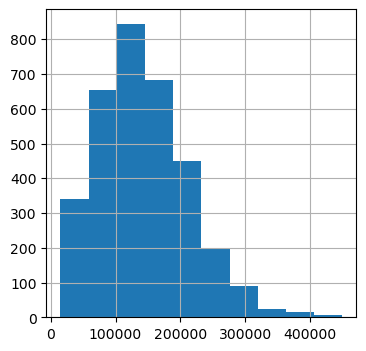

In [13]:
# Analyse la distribution
plt.figure(figsize=((4, 4)))
df["Salary"].hist()
plt.ylim(0)
plt.show()

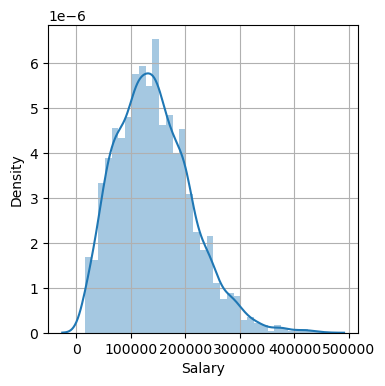

In [14]:
plt.figure(figsize=((4, 4)))
sns.distplot(df["Salary"]) 
plt.grid(visible=True)
plt.show()

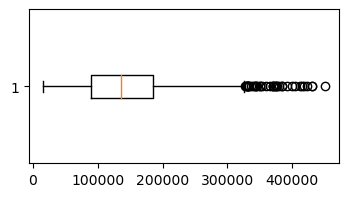

In [15]:
plt.figure(figsize=((4, 2)))
plt.boxplot(df["Salary"], vert=False)
plt.show()

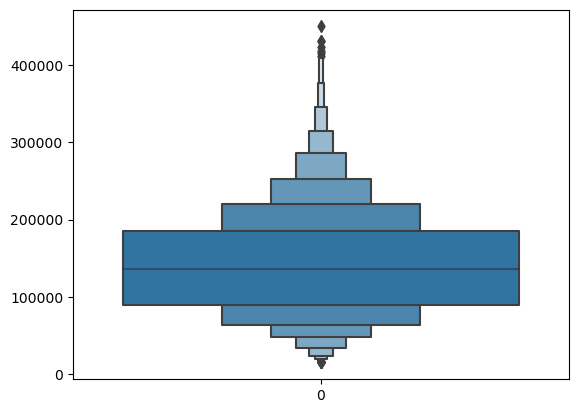

In [16]:
sns.boxenplot(df.Salary)
plt.show()

**Interpretation** 🍎

**-->** La variable continue ***salary*** a une  distribution normale

**-->** Elle contient également quelque valeurs abérentes

**2**. Variables categorielles

In [17]:
#
cat_col = ['Job','Job_type','Experience','Expertise','Currency','Company_Location','Residence','Year','Company_Size']

In [18]:
# Nombre de valeur par categorie
for col in cat_col:
    print(f"{col} : {df[col].nunique()}") 

Job : 111
Job_type : 4
Experience : 4
Expertise : 4
Currency : 22
Company_Location : 71
Residence : 83
Year : 4
Company_Size : 3


In [19]:
# les differents experiences des data sciences
df["Experience"].value_counts()

Senior       2065
Mid           797
Entry         292
Executive     146
Name: Experience, dtype: int64

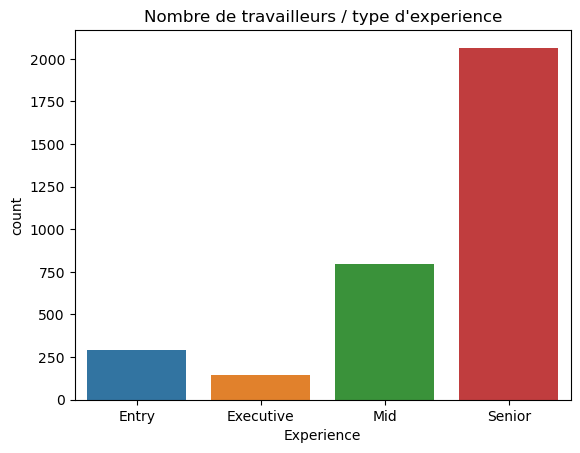

In [20]:
#Comparaison du nombre de data scientist par experience
df1 = df.copy()
df1["Experience"] = df1["Experience"].astype("category")
plt.title("Nombre de travailleurs / type d'experience")

sns.countplot(data=df1, x="Experience")
plt.show()

In [21]:
df["Expertise"].value_counts()

Expert          2065
Intermediate     797
Junior           292
Director         146
Name: Expertise, dtype: int64

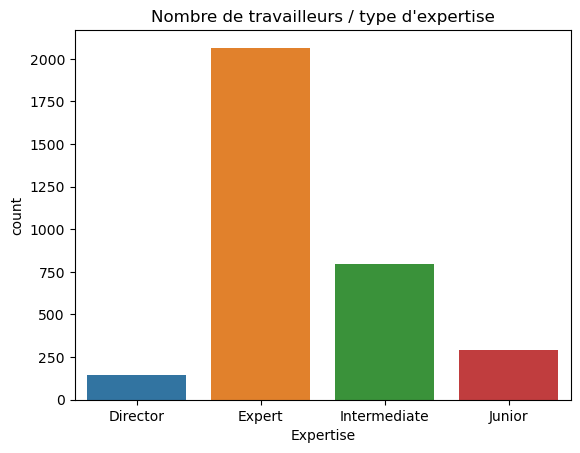

In [22]:
#Comparaison du nombre de data scientist par Expertise
df1["Expertise"] = df1["Expertise"].astype("category")
plt.title("Nombre de travailleurs / type d'expertise")
sns.countplot(data=df1, x="Expertise")
plt.show()



In [23]:
df["Company_Size"].value_counts()

Medium    2707
Large      442
Small      151
Name: Company_Size, dtype: int64

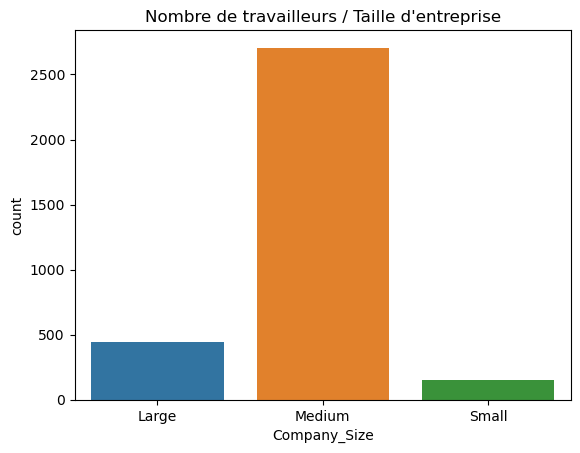

In [24]:
#Comparaison du nombre de data scientist en fonction de la taille de leur entreprise
df1["Company_Size"] = df1["Company_Size"].astype("category")

sns.countplot(data=df1, x="Company_Size")
plt.title("Nombre de travailleurs / Taille d'entreprise")
plt.show()

In [25]:
df["Job_type"].value_counts()

Full-Time    3261
Contract       15
Part-Time      13
Freelance      11
Name: Job_type, dtype: int64

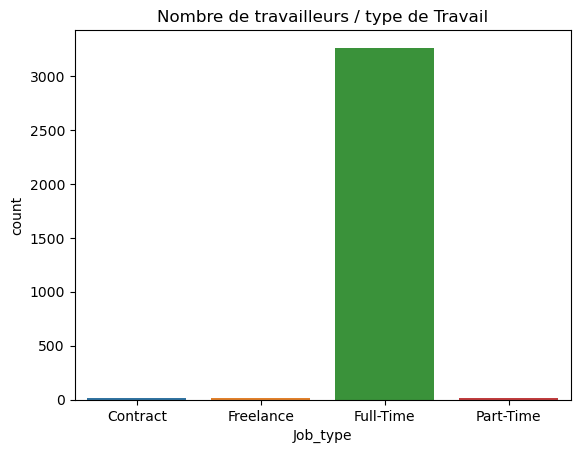

In [26]:
df1["Job_type"] = df1["Job_type"].astype("category")

sns.countplot(data=df1, x="Job_type")
plt.title("Nombre de travailleurs / type de Travail")
plt.show()

In [27]:
df["Currency"].value_counts()

United States Dollar      2770
Euro                       222
British Pound Sterling     181
Indian Rupee                45
Canadian Dollar             29
Australian Dollar           10
Singapore Dollar             6
Polish Zloty                 6
Swiss Franc                  5
Japanese Yen                 4
Danish Krone                 3
Turkish Lira                 3
Brazilian Real               3
Hungarian Forint             3
Thai Baht                    2
Norwegian Krone              2
Israeli New Shekel           1
Hong Kong Dollar             1
South African Rand           1
Philippine Peso              1
Mexican Peso                 1
Chilean Peso                 1
Name: Currency, dtype: int64

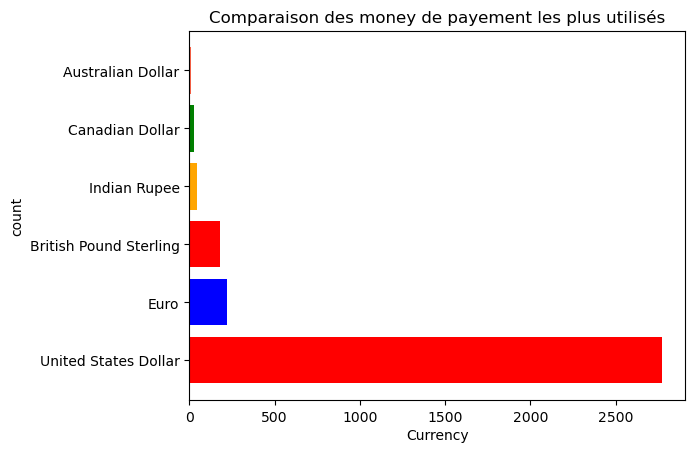

In [28]:
#Comparaison du nombre de personne par unité de payement monetaire

count_cur = pd.DataFrame(df["Currency"].value_counts())
count_cur = count_cur.loc[df["Currency"].value_counts() >=10]
fig, ax = plt.subplots()
currency = list(count_cur.index)
counts = [x[0] for x in count_cur.values]
#bar
bar_colors = ['red', 'blue', 'red', 'orange', 'green', 'tomato']
ax.barh(currency, counts, color=bar_colors)
ax.set_ylabel('count')
ax.set_xlabel("Currency", labelpad=3)

ax.set_title('Comparaison des money de payement les plus utilisés')
plt.show()

In [29]:
# Filtrer les lignes où la valeur dans la colonne "Currency" a moins de 10 occurrences
counts = df["Currency"].value_counts()

filtered_df = df.loc[df["Currency"].isin(counts[counts < 10].index)]
print(len(filtered_df["Currency"].value_counts()))
filtered_df["Currency"].value_counts()

16


Polish Zloty          6
Singapore Dollar      6
Swiss Franc           5
Japanese Yen          4
Turkish Lira          3
Brazilian Real        3
Hungarian Forint      3
Danish Krone          3
Norwegian Krone       2
Thai Baht             2
Philippine Peso       1
South African Rand    1
Hong Kong Dollar      1
Israeli New Shekel    1
Mexican Peso          1
Chilean Peso          1
Name: Currency, dtype: int64

In [30]:
df["Job"].value_counts()

Data Engineer                      702
Data Scientist                     635
Data Analyst                       459
Machine Learning Engineer          300
Analytics Engineer                 132
                                  ... 
Deep Learning Researcher             1
Analytics Engineering Manager        1
AWS Data Architect                   1
BI Data Engineer                     1
Staff Machine Learning Engineer      1
Name: Job, Length: 111, dtype: int64

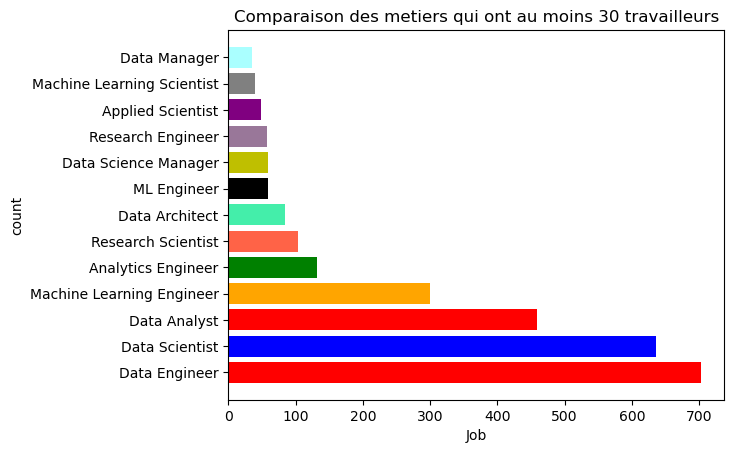

In [31]:
# comparaison du nombre de travailleur en fonction des travails les plus demandés

job_count = pd.DataFrame(df["Job"].value_counts())
job_count = job_count.loc[df["Job"].value_counts() >=30]
fig, ax = plt.subplots()
job = list(job_count.index)
counts = [x[0] for x in job_count.values]
#color
bar_colors = ['red', 'blue', 'red', 'orange', 'green', 'tomato','#4EA',
            '#000', 'y', '#979', 'purple', 'grey', '#Aff', '#E3A', '#9E0']
#bar
ax.barh(job, counts, color=bar_colors)
ax.set_ylabel('count')
ax.set_xlabel("Job")
ax.set_title('Comparaison des metiers qui ont au moins 30 travailleurs')
plt.show()

In [32]:
# Filtrer les lignes où la valeur dans la colonne "Job" a moins de 10 occurrences
counts = df["Job"].value_counts()

filtered_df = df.loc[df["Job"].isin(counts[counts < 10].index)]
print(len(filtered_df["Job"].value_counts()))
filtered_df["Job"].value_counts()

78


Lead Data Scientist                9
AI Developer                       9
Principal Data Scientist           9
Machine Learning Developer         8
Deep Learning Engineer             8
                                  ..
AWS Data Architect                 1
BI Data Engineer                   1
Staff Machine Learning Engineer    1
Data DevOps Engineer               1
Marketing Data Engineer            1
Name: Job, Length: 78, dtype: int64

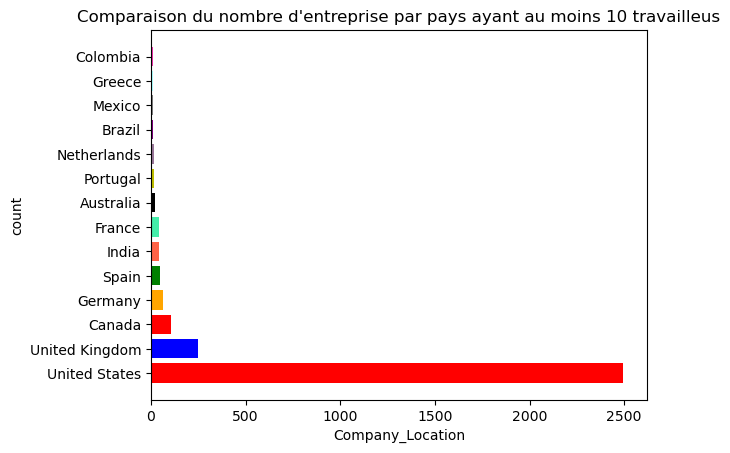

In [33]:
loc_count = pd.DataFrame(df["Company_Location"].value_counts())
loc_count = loc_count.loc[df["Company_Location"].value_counts() >=10]
fig, ax = plt.subplots()
loc = list(loc_count.index)
counts = [x[0] for x in loc_count.values] 
#color
bar_colors = ['red', 'blue', 'red', 'orange', 'green', 'tomato','#4EA',
            '#000', 'y', '#979', 'purple', 'grey', '#Aff', '#E3A', '#9E0']
#bar
ax.barh(loc, counts, color=bar_colors)
ax.set_ylabel('count')
ax.set_xlabel("Company_Location")
ax.set_title("Comparaison du nombre d'entreprise par pays ayant au moins 10 travailleus")
plt.show()

In [34]:
# Filtrer les lignes où la valeur dans la colonne "Company_Location" a moins de 10 occurrences
counts = df["Company_Location"].value_counts()

filtered_df = df.loc[df["Company_Location"].isin(counts[counts < 10].index)]
print(len(filtered_df["Company_Location"].value_counts()))
filtered_df["Company_Location"].value_counts()

57


Nigeria                      8
Japan                        8
Ireland                      7
Estonia                      6
Italy                        6
Austria                      6
Poland                       6
Argentina                    5
Singapore                    5
Turkey                       5
Switzerland                  5
Slovenia                     4
Russian Federation           4
Latvia                       4
Puerto Rico                  4
Denmark                      4
Belgium                      4
Thailand                     3
Croatia                      3
United Arab Emirates         3
Sweden                       3
Ukraine                      3
Finland                      3
Israel                       3
Central African Republic     2
Indonesia                    2
Philippines                  2
Luxembourg                   2
American Samoa               2
Hungary                      2
Czechia                      2
Lithuania                    2
Pakistan

In [35]:
df["Year"].value_counts()

2023    1996
2022    1016
2021     215
2020      73
Name: Year, dtype: int64

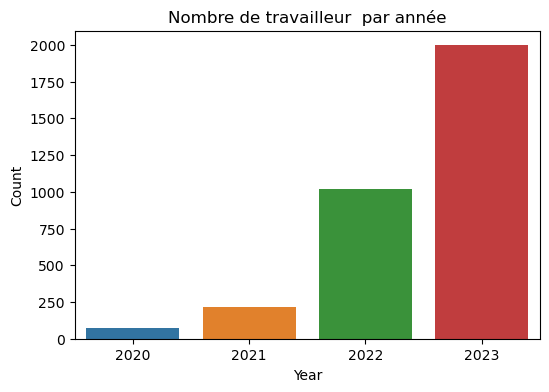

In [36]:
plt.figure(figsize=(6, 4))  

ax = sns.countplot(data=df, x="Year")
plt.title("Nombre de travailleur  par année")
plt.xlabel("Year")
plt.ylabel("Count")
plt.show()

**Interpretation** 🍎

--> Nous constatons à l'issue de cette exploration que les  modalités de certaines variables sont 

très rares sur **3300** individus. Par exemple Pour la variable "Job"  **78** individus ont un effectif **<10**

pour la variable "Company_Location" **57** individus et pour la variable  "Currency"  **16** individus.

--> Nous constatons également que la variable "Job_type" a une variance très faible. Elle est considerablement dominée 

par la modalité ***Full-Time*** (**3261** individus sur **3300**). Elle apporte donc très peux d'informations.

--> De façon generale le dataset très déséquilibré. Certaines variables ont des modalités très representé par rapport à d'autres modalités


**II**. Analyse Bivariée

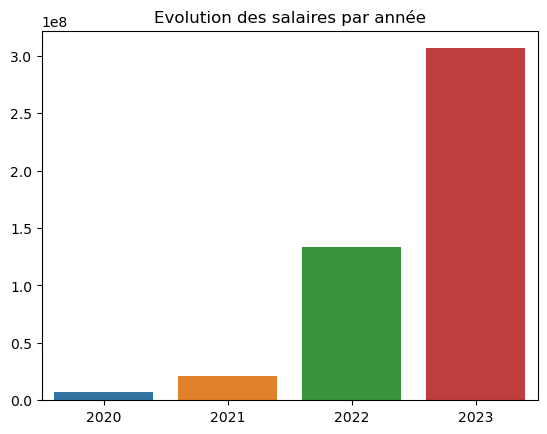

In [37]:
# Masse salariale par année
x = [2020, 2021, 2022, 2023]
y = [ x[0] for x in df[["Year", "Salary"]].groupby(["Year"]).sum().values]
sns.barplot(x=x,y=y)

plt.title("Evolution des salaires par année")
plt.show()

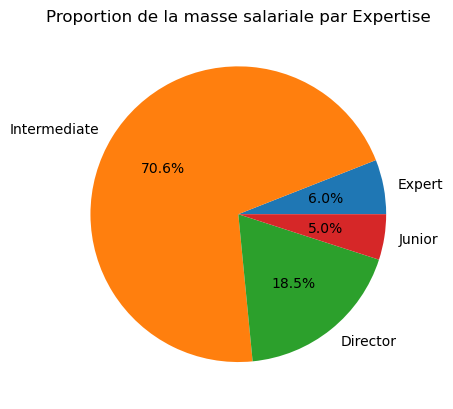

In [38]:
experti_by_sal  =[ x[0] for x in df[["Expertise", "Salary"]].groupby(["Expertise"]).sum().values]
plt.pie(experti_by_sal,labels=tuple(df["Expertise"].unique()),autopct="%1.1f%%")
plt.title("Proportion de la masse salariale par Expertise")
plt.show()

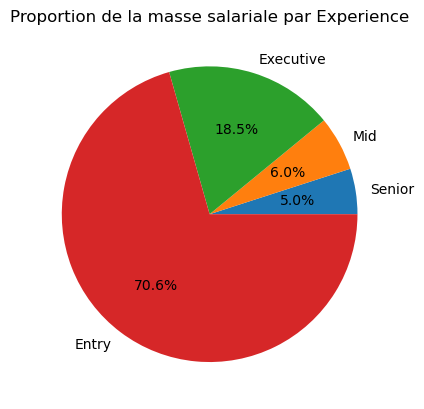

In [39]:
experien_by_sal =[ x[0] for x in df[["Experience", "Salary"]].groupby(["Experience"]).sum().values]
plt.pie(experien_by_sal,labels=tuple(df["Experience"].unique()),autopct="%1.1f%%")
plt.title("Proportion de la masse salariale par Experience")
plt.show()

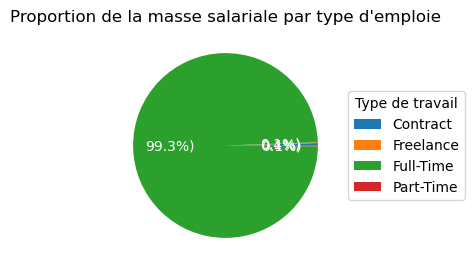

In [40]:
fig, ax = plt.subplots(figsize=(6, 3), subplot_kw=dict(aspect="equal"))
job_type_by_sal =[ x[0] for x in df[["Job_type", "Salary"]].groupby(["Job_type"]).sum().values]
job_type =['Contract', 'Freelance', 'Full-Time' , 'Part-Time']

def func(pct, allvals):
    absolute = int(np.round(pct/100.*np.sum(allvals)))
    return "{:.1f}%)".format(pct)

wedges, texts, autotexts = ax.pie(job_type_by_sal, autopct=lambda pct: func(pct, job_type_by_sal),textprops=dict(color="w"))

ax.legend(wedges, job_type, title="Type de travail", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

ax.set_title("Proportion de la masse salariale par type d'emploie")

plt.show()

**Interpretation** 🍎

--> Ces graphiques illustrent très bien les remarques précedentes. Plus on a des individus pour une modalité d'une variable donnée

plus la somme de leur salaire est élévé. **99%**  de masse salariale des data scientist dans le monde est detenu par les travailleurs 

**full-time**.

**Creation du Modèle de Prédiction du salaire**

1. Pretraitement des données

- équilibre du dataset

In [42]:
# remplace chaque modalité dont le nombre d'occurences est inferieur à 10 par une nouvelle modalité 

imbalanceCol = ["Company_Location", "Job"]

for col in imbalanceCol:
    counts = df[col].value_counts()
    modalities = counts[counts < 10].index.tolist()
    df[col] = df[col].replace(modalities, f"rare_{col}")

In [44]:
# check
counts = df["Company_Location"].value_counts()

filtered_df = df.loc[df["Company_Location"].isin(counts[counts < 10].index)]
print(len(filtered_df["Company_Location"].value_counts()))
filtered_df["Company_Location"].value_counts()

0


Series([], Name: Company_Location, dtype: int64)

In [45]:
# Suppression de la colonne Job_type. Elle n'apporte aucune information

df.drop(['Job_type'], axis=1,inplace=True)

- suppression des outliers

In [46]:
def detect_outliers(df_detect_out) :
    '''
        Fonction permettant de detecter les valeurs aberrantes
        @params df_detect_out est de type dataframme
    '''
    q1 = np.quantile(df_detect_out, 0.25)
    q3 = np.quantile(df_detect_out, 0.75)
    eiq= q3 - q1
    li = q1 - (eiq * 1.5)
    ls = q3 + (eiq * 1.5)
    i  = list(df_detect_out.index[(df_detect_out<li) | (df_detect_out>ls)])
    val= list(df_detect_out[i])
    return i, val

In [47]:
index, val = detect_outliers(df["Salary"])
df.drop(index, axis=0, inplace=True)

In [48]:
# les outliers
np.array(val).T

array([330000, 383910, 392000, 359170, 331640, 331640, 331640, 365630,
       330000, 370000, 345000, 370000, 374000, 399880, 333500, 329500,
       328000, 336400, 430640, 342810, 342300, 353200, 417937, 376080,
       340000, 370000, 375000, 385000, 350000, 430967, 375000, 350000,
       345600, 405000, 380000, 450000, 416000, 423000, 412000])

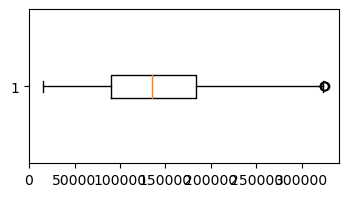

In [49]:
plt.figure(figsize=((4, 2)))
plt.boxplot(df["Salary"], vert=False)
plt.show()

In [50]:
index, val = detect_outliers(df["Salary"])

In [51]:
df.drop(index, axis=0, inplace=True)

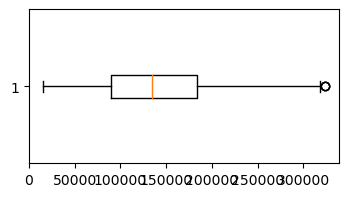

In [52]:
plt.figure(figsize=((4, 2)))
plt.boxplot(df["Salary"], vert=False)
plt.show()

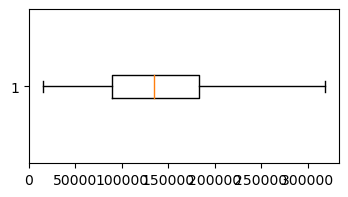

In [53]:
#Suppression
index, val = detect_outliers(df["Salary"])
df.drop(index, axis=0, inplace=True)
plt.figure(figsize=((4, 2)))
plt.boxplot(df["Salary"], vert=False)
plt.show()

Encodage des variables categoriels

In [54]:
# Les varaiables 'Company_Size', 'Expertise', 'Experience' sont des variables categoriels ordinales
from sklearn.preprocessing import LabelEncoder

oridinal_vars = ['Company_Size', 'Expertise', 'Experience', "Year"]
encoder = LabelEncoder()
for var in oridinal_vars:
    df[var] = encoder.fit_transform(df[var])

In [55]:
df[['Company_Size', 'Expertise', 'Experience', "Year"]]

,Company_Size,Expertise,Experience,Year
0,1,1,3,3
1,1,1,3,3
2,1,1,3,3
3,1,1,3,3
4,1,1,3,3
...,...,...,...,...
3294,0,1,3,1
3296,0,2,2,1
3297,2,3,0,0
3298,0,3,0,0


In [56]:
#Les variables 'Job',  'Currency',  'Company_Location',  'Residence' sont non ordinales
vars = ['Job',   'Currency',  'Company_Location',  'Residence']
df_dumm  = pd.get_dummies(df[vars], drop_first=True)
df_dumm = df_dumm.astype(int)

In [57]:
df = pd.concat([df, df_dumm], axis=1)
df.drop(['Job',  'Currency',  'Company_Location',  'Residence'], axis=1,inplace=True)

In [58]:
df.head()

,Experience,Expertise,Salary,Company_Size,Year,Job_Analytics Engineer,Job_Applied Data Scientist,Job_Applied Machine Learning Scientist,Job_Applied Scientist,Job_BI Analyst,...,Residence_Switzerland,Residence_Thailand,Residence_Tunisia,Residence_Turkey,Residence_Ukraine,Residence_United Arab Emirates,Residence_United Kingdom,Residence_United States,Residence_Uzbekistan,Residence_Viet Nam
0,3,1,210000,1,3,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,3,1,165000,1,3,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,3,1,185900,1,3,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,3,1,129300,1,3,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,3,1,140000,1,3,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


2. Normalisation des données

In [59]:
# Normalisation de la variable cible salary

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

df["Salary"] =  scaler.fit_transform(df["Salary"].values.reshape(-1, 1))


In [60]:
df.head()

,Experience,Expertise,Salary,Company_Size,Year,Job_Analytics Engineer,Job_Applied Data Scientist,Job_Applied Machine Learning Scientist,Job_Applied Scientist,Job_BI Analyst,...,Residence_Switzerland,Residence_Thailand,Residence_Tunisia,Residence_Turkey,Residence_Ukraine,Residence_United Arab Emirates,Residence_United Kingdom,Residence_United States,Residence_Uzbekistan,Residence_Viet Nam
0,3,1,0.642928,1,3,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,3,1,0.494560,1,3,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,3,1,0.563469,1,3,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,3,1,0.376855,1,3,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,3,1,0.412133,1,3,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [61]:
df.shape

(3254, 137)

In [62]:
# Division des données en varible cible et variable explicatives
x_data, y_data=df.drop(['Salary'], axis=1), df.Salary

3. Division des données de tests et d'entrainements

In [63]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_data.values, y_data, test_size=0.2, shuffle=False)

**4. Modèles mathèmathiques**

- Recherche d'hyperparametres: GridSearchCV, RandomSearchCV, BayesSearchCV

1. Grid search CV

In [64]:
from sklearn.ensemble import( RandomForestRegressor,
                            GradientBoostingRegressor,AdaBoostRegressor,
                            ExtraTreesRegressor, GradientBoostingRegressor, )
from sklearn import tree
from sklearn.linear_model import LinearRegression, Ridge, Lasso
import xgboost as xgb
from catboost import CatBoostRegressor
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV

- Adaboost

In [65]:
#model
adaB= AdaBoostRegressor()

# h
base_models = [
    None,
    ExtraTreesRegressor(n_estimators= 5,
                criterion= 'mse',
                max_features = 'log2'),

    RandomForestRegressor(n_estimators= 5,
                    min_samples_split = 3),

    tree.DecisionTreeRegressor(
                max_depth = 5,
                min_samples_split = 2,
                min_samples_leaf=9
            ), 
    Lasso(alpha=1.0)
    ]  

tuned_parameters = { 'base_estimator':base_models,
                        'loss' : ['exponential', "linear"],
                        'learning_rate' : [1]}
# search
adab_search = GridSearchCV(AdaBoostRegressor(), tuned_parameters, cv=4)
adab_search.fit(x_train, y_train)

# best model
adab_search.best_estimator_

accuracy=adab_search.score(x_test,y_test)
accuracy

0.47392355962712496

In [66]:
adab_search.best_estimator_

AdaBoostRegressor(base_estimator=RandomForestRegressor(min_samples_split=3,
                                                       n_estimators=5),
                  learning_rate=1)

In [185]:
#model
adaB_model= AdaBoostRegressor()

# h
base_models = [
    None,
    ExtraTreesRegressor(n_estimators= 5,
                criterion= 'mse',
                max_features = 'log2'),

    RandomForestRegressor(n_estimators= 5,
                    min_samples_split = 3),

    tree.DecisionTreeRegressor(
                max_depth = 3,
                min_samples_split = 2,
                min_samples_leaf=5
            ), 
    Lasso(alpha=10, max_iter=100), 
    CatBoostRegressor(),
    Ridge()
    ]  

tuned_parameters = { 'base_estimator':base_models,
                        'loss' : ['exponential', "linear"],
                        'learning_rate' : [1]}
# search
adab_search_model = GridSearchCV(adaB_model, tuned_parameters, cv=4)
adab_search_model.fit(x_train, y_train)



accuracy=adab_search_model.score(x_test,y_test)
accuracy

Learning rate set to 0.045507
0:	learn: 0.2010112	total: 2.21ms	remaining: 2.21s
1:	learn: 0.1986488	total: 3.81ms	remaining: 1.9s
2:	learn: 0.1960434	total: 5.11ms	remaining: 1.7s
3:	learn: 0.1938752	total: 6.12ms	remaining: 1.52s
4:	learn: 0.1914256	total: 8.23ms	remaining: 1.64s
5:	learn: 0.1895111	total: 9.82ms	remaining: 1.63s
6:	learn: 0.1874911	total: 11.2ms	remaining: 1.59s
7:	learn: 0.1856201	total: 12.7ms	remaining: 1.58s
8:	learn: 0.1840166	total: 15.2ms	remaining: 1.68s
9:	learn: 0.1823369	total: 17.5ms	remaining: 1.74s
10:	learn: 0.1808347	total: 19.3ms	remaining: 1.74s
11:	learn: 0.1794294	total: 21.4ms	remaining: 1.76s
12:	learn: 0.1783310	total: 23.4ms	remaining: 1.78s
13:	learn: 0.1771412	total: 25.1ms	remaining: 1.77s
14:	learn: 0.1760609	total: 26.4ms	remaining: 1.74s
15:	learn: 0.1749510	total: 28.1ms	remaining: 1.73s
16:	learn: 0.1739787	total: 29.8ms	remaining: 1.72s
17:	learn: 0.1730909	total: 31.5ms	remaining: 1.72s
18:	learn: 0.1722223	total: 33.2ms	remaining: 

0.5084077039513497

In [186]:

# best model
adab_search_model.best_estimator_


AdaBoostRegressor(base_estimator=<catboost.core.CatBoostRegressor object at 0x00000262755C0C70>,
                  learning_rate=1)

In [180]:
param_grid_rf = {
    'n_estimators': [ 50],                
    'max_depth': [10, 20],                
    'min_samples_split': [2, 3],                
    'min_samples_leaf': [1, 2, 4] 
}

random_forest = RandomForestRegressor()
grid_search_rf = GridSearchCV(random_forest, param_grid_rf, cv=5)
grid_search_rf.fit(x_train, y_train)
print("Random Forest - score (R2):", grid_search_rf.best_score_)


Random Forest - score (R2): 0.3498414572674799


In [189]:
catboost_reg = CatBoostRegressor()

param_grid_catboost = {}

grid_search_catboost = GridSearchCV(catboost_reg, param_grid_catboost, cv=5)
grid_search_catboost.fit(x_train, y_train)
print("Cat boost - score (R2):", grid_search_catboost.best_score_)

Learning rate set to 0.045973
0:	learn: 0.2068910	total: 2.68ms	remaining: 2.67s
1:	learn: 0.2039456	total: 4.83ms	remaining: 2.41s
2:	learn: 0.2016191	total: 6.72ms	remaining: 2.23s
3:	learn: 0.1990245	total: 9.13ms	remaining: 2.27s
4:	learn: 0.1966219	total: 13.7ms	remaining: 2.72s
5:	learn: 0.1942945	total: 18ms	remaining: 2.98s
6:	learn: 0.1923384	total: 21.1ms	remaining: 2.99s
7:	learn: 0.1905623	total: 23.7ms	remaining: 2.94s
8:	learn: 0.1889511	total: 26.7ms	remaining: 2.94s
9:	learn: 0.1872430	total: 29.6ms	remaining: 2.93s
10:	learn: 0.1855587	total: 31.8ms	remaining: 2.86s
11:	learn: 0.1842386	total: 33.8ms	remaining: 2.79s
12:	learn: 0.1829888	total: 35.9ms	remaining: 2.72s
13:	learn: 0.1816540	total: 39.4ms	remaining: 2.77s
14:	learn: 0.1804454	total: 42.1ms	remaining: 2.76s
15:	learn: 0.1794818	total: 43.8ms	remaining: 2.69s
16:	learn: 0.1787336	total: 45.6ms	remaining: 2.64s
17:	learn: 0.1776962	total: 48.2ms	remaining: 2.63s
18:	learn: 0.1769488	total: 50.1ms	remaining: 

- RandomForestRegressor, LinearRegression, GradientBoostingRegressor, DecisionTreeRegressor, SVR, Ridge,

In [88]:
# definition parametres
param_grid_lr = {}

param_grid_rf = {
    'n_estimators': [100, 200, 500],                
    'max_depth': [10, 20, 50,100,500],                
    'min_samples_split': [2, 5, 10],                
    'min_samples_leaf': [1, 2, 4,10] 
}

param_grid_gb = {
    'learning_rate': [0.001, 0.01, 0.1, 0.2, 0.5],
    'n_estimators': [50, 100, 200],
    'subsample': [0.5, 0.8, 1.0],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'min_weight_fraction_leaf': [0.0, 0.1, 0.2],
    'max_depth': [3, 5, 10],
    'min_impurity_decrease': [0.0, 0.1, 0.2],
    'alpha': [0.9, 0.95, 0.99]
}

param_grid_svr = {
    'C': [1, 10, 100],
    'epsilon': [0.1, 0.01, 0.001]
}

param_grid_dt = {
    'max_depth':[5, 10, 15,100,200,500],
    'min_samples_leaf':[2, 5, 10,11],
    'min_samples_split':[1,2,4,5],
    'splitter':['best'],
    'min_weight_fraction_leaf':[0.0]
}

param_grid_rdge ={
    'alpha': [0.01, 0.1, 1.0, 10.0],        
    'fit_intercept': [True, False],          
    'max_iter': [500, 1000, 2000],          
    'tol': [0.001, 0.01],                  
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sag', 'saga'], 
    'random_state': [42] 
}

param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.1, 0.05, 0.01],
    'max_depth': [3, 5, 7]
}

param_grid_catboost = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.1, 0.05, 0.01],
    'depth': [3, 5, 7]
}

# initiation des modèles
linear_reg = LinearRegression()
random_forest = RandomForestRegressor()
gradient_boosting = GradientBoostingRegressor()
tree_reg  = tree.DecisionTreeRegressor()
svr = SVR()
ridge_reg = Ridge()
xgb_reg = xgb.XGBRegressor()
catboost_reg = CatBoostRegressor()

# gridschearcv
grid_search_lr = GridSearchCV(linear_reg, param_grid_lr)
grid_search_rf = GridSearchCV(random_forest, param_grid_rf)
grid_search_gb = GridSearchCV(gradient_boosting, param_grid_gb)
grid_search_svr = GridSearchCV(svr, param_grid_svr)
grid_search_dtr = GridSearchCV(tree_reg, param_grid_dt)
grid_search_rdg = GridSearchCV(ridge_reg, param_grid_rdge)
grid_search_xgb = GridSearchCV(xgb_reg, param_grid_xgb)
grid_search_catboost = GridSearchCV(catboost_reg, param_grid_catboost)


In [ ]:
# Fit
grid_search_lr.fit(x_train, y_train)
grid_search_rf.fit(x_train, y_train)
grid_search_gb.fit(x_train, y_train)
grid_search_svr.fit(x_train, y_train)
grid_search_svr.fit(x_train, y_train)
grid_search_rdg.fit(x_train, y_train)

In [85]:
# score
print("Linear Regression - score (R2):", grid_search_lr.best_score_)

print("Random Forest - score (R2):", grid_search_rf.best_score_)

print("Gradient Boosting - score (R2):", grid_search_gb.best_score_)

print("S V R- score (R2):", grid_search_svr.best_score_)

print("DecisionTreeRegressor - score (R2):", grid_search_dtr.best_score_)

print("Ridge - score (R2):", grid_search_rdg.best_score_)

Linear Regression - score (R2): -1.502890546777509e+22
Random Forest - score (R2): 0.3434285088392469
Gradient Boosting - score (R2): 0.36187561371636656
S V R- score (R2): 0.3697406172086342
DecisionTreeRegressor - score (R2): 0.31444246246847535


2. BayesSearch

In [67]:
from skopt import BayesSearchCV

hyperparameters = {
    'alpha': [0.01, 0.1, 1.0, 10.0],      
    'fit_intercept': [True, False],          
    'max_iter': [500, 1000, 2000],        
    'tol': [0.001, 0.01],                 
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sag', 'saga'],  
    'random_state': [42]                     
}

bayes_search = BayesSearchCV(Ridge(), hyperparameters, cv =3,  n_iter = 20)
bayes_search = bayes_search.fit(x_train, y_train)

bayes_search.fit(x_train,y_train)
bayes_search.score(x_test,y_test)

0.4876287078310586

In [102]:
# definition parametres
param_grid_lr = {}

param_grid_rf = {
    'n_estimators': [100, 200, 500],                
    'max_depth': [10, 20, 50,100,500],                
    'min_samples_split': [2, 5, 10],                
    'min_samples_leaf': [1, 2, 4,10] 
}

param_grid_gb = {
    'learning_rate': [0.001, 0.01, 0.1, 0.2, 0.5],
    'n_estimators': [50, 100, 200],
    'subsample': [0.5, 0.8, 1.0],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'min_weight_fraction_leaf': [0.0, 0.1, 0.2],
    'max_depth': [10, 20, 50,100,500],
    'min_impurity_decrease': [0.0, 0.1, 0.2],
    'alpha': [0.9, 0.95, 0.99]
}

param_grid_svr = {
    'C': [1, 10, 100],
    'epsilon': [0.1, 0.01, 0.001]
}

param_grid_dt = {
    'max_depth':[10, 20, 50,100,500],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'splitter': ['best', 'random']
}

param_grid_rdge ={
    'alpha': [0.01, 0.1, 1.0, 10.0],        
    'fit_intercept': [True, False],          
    'max_iter': [500, 1000, 2000],          
    'tol': [0.001, 0.01],                  
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sag', 'saga'], 
    'random_state': [42] 
}

param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.1, 0.05, 0.01],
    'max_depth': [10, 20, 50,100,500]
}

param_grid_catboost = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.1, 0.05, 0.01],
    'depth':  [10, 20, 50,100,500]
}

# initiation des modèles
linear_reg = LinearRegression()
random_forest = RandomForestRegressor()
gradient_boosting = GradientBoostingRegressor()
tree_reg  = tree.DecisionTreeRegressor()
svr = SVR()
ridge_reg = Ridge()
xgb_reg = xgb.XGBRegressor()
catboost_reg = CatBoostRegressor()

# gridschearcv
# bayes_search_lr = BayesSearchCV(linear_reg)
bayes_search_rf = BayesSearchCV(random_forest, param_grid_rf ,  cv =3,  n_iter = 20)
bayes_search_gb = BayesSearchCV(gradient_boosting, param_grid_gb ,  cv =3,  n_iter = 20)
bayes_search_svr = BayesSearchCV(svr, param_grid_svr ,  cv =3,  n_iter = 20)
bayes_search_dtr = BayesSearchCV(tree_reg, param_grid_dt)
bayes_search_rdg = BayesSearchCV(ridge_reg, param_grid_rdge ,  cv =3,  n_iter = 20)
bayes_search_xgb = BayesSearchCV(xgb_reg, param_grid_xgb ,  cv =3,  n_iter = 20)
bayes_search_catboost = BayesSearchCV(catboost_reg, param_grid_catboost ,  cv =3,  n_iter = 20)


In [107]:
bayes_search_rf.fit(x_train, y_train)
bayes_search_gb.fit(x_train, y_train)
bayes_search_svr.fit(x_train, y_train)
bayes_search_rdg.fit(x_train, y_train)
bayes_search_dtr.fit(x_train, y_train)


BayesSearchCV(estimator=DecisionTreeRegressor(),
              search_spaces={'max_depth': [10, 20, 50, 100, 500],
                             'min_samples_leaf': [1, 2, 4],
                             'min_samples_split': [2, 5, 10],
                             'splitter': ['best', 'random']})

In [109]:
# score
# print("Linear Regression - score (R2):", bayes_search_lr.best_score_)

print("Random Forest - score (R2):", bayes_search_rf.best_score_)

print("Gradient Boosting - score (R2):", bayes_search_gb.best_score_)

print("S V R- score (R2):", bayes_search_svr.best_score_)

print("DecisionTreeRegressor - score (R2):", bayes_search_dtr.best_score_)

print("Ridge - score (R2):", bayes_search_rdg.best_score_)

Random Forest - score (R2): 0.34540184583584677
Gradient Boosting - score (R2): 0.3608623261684955
S V R- score (R2): 0.36272174978086386
DecisionTreeRegressor - score (R2): 0.33014634182425506
Ridge - score (R2): 0.37623442023500964


3. RandomSearch

In [68]:
from sklearn.model_selection import RandomizedSearchCV

hyperparameters = {
    'alpha': [0.01, 0.1, 1.0, 10.0],      
    'fit_intercept': [True, False],          
    'max_iter': [500, 1000, 2000],        
    'tol': [0.001, 0.01],                 
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sag', 'saga'],  
    'random_state': [42]                     
}


clf_rs = RandomizedSearchCV(Ridge(), hyperparameters, cv = 5, n_iter = 20)
random_search = clf_rs.fit(x_train, y_train)

model_rdg = Ridge(alpha=random_search.best_params_["alpha"],
                fit_intercept=random_search.best_params_["fit_intercept"],
                max_iter=random_search.best_params_["max_iter"],
                tol=random_search.best_params_["tol"],
                solver=random_search.best_params_["solver"],
                random_state=random_search.best_params_["random_state"])

model_rdg.fit(x_train,y_train)
model_rdg.score(x_test,y_test)

0.5116441408199506

**Interpretation** 🍎
---> Le meilleurs model est : 
---> Avec un score de : 

**5. Reseaux de Neurone**

In [69]:
x_data.shape

(3254, 136)

In [70]:
# Librairies
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"]= "2"
import tensorflow as tf
from tensorflow import keras

1. initialisation du modèle: lineaire

In [78]:
model_rnn = keras.models.Sequential([
    keras.layers.InputLayer(input_shape=(len(x_data.columns),)),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dense(1, activation='linear'),
])

# loss and optimizer
loss = keras.losses.MeanSquaredError()
optim = keras.optimizers.Adam(learning_rate=0.1)

model_rnn.compile(loss=loss, optimizer=optim)

batch_size = 64
epochs = 30
model_rnn.fit(x_train, y_train, batch_size=batch_size, epochs=epochs , verbose=2)

from sklearn.metrics import r2_score

y_pred = model_rnn.predict(x_test)

# Compute the R2 score for model evaluation
r2_score_value = r2_score(y_test, y_pred)
print("R-squared (R2) Score:", r2_score_value)

Epoch 1/30
41/41 - 1s - loss: 6.2473 - 717ms/epoch - 17ms/step
Epoch 2/30
41/41 - 0s - loss: 0.0410 - 135ms/epoch - 3ms/step
Epoch 3/30
41/41 - 0s - loss: 0.0358 - 130ms/epoch - 3ms/step
Epoch 4/30
41/41 - 0s - loss: 0.0318 - 117ms/epoch - 3ms/step
Epoch 5/30
41/41 - 0s - loss: 0.0306 - 150ms/epoch - 4ms/step
Epoch 6/30
41/41 - 0s - loss: 0.0295 - 116ms/epoch - 3ms/step
Epoch 7/30
41/41 - 0s - loss: 0.0273 - 115ms/epoch - 3ms/step
Epoch 8/30
41/41 - 0s - loss: 0.0269 - 114ms/epoch - 3ms/step
Epoch 9/30
41/41 - 0s - loss: 0.0299 - 116ms/epoch - 3ms/step
Epoch 10/30
41/41 - 0s - loss: 0.0301 - 120ms/epoch - 3ms/step
Epoch 11/30
41/41 - 0s - loss: 0.0280 - 125ms/epoch - 3ms/step
Epoch 12/30
41/41 - 0s - loss: 0.0268 - 151ms/epoch - 4ms/step
Epoch 13/30
41/41 - 0s - loss: 0.0260 - 149ms/epoch - 4ms/step
Epoch 14/30
41/41 - 0s - loss: 0.0260 - 150ms/epoch - 4ms/step
Epoch 15/30
41/41 - 0s - loss: 0.0262 - 121ms/epoch - 3ms/step
Epoch 16/30
41/41 - 0s - loss: 0.0275 - 122ms/epoch - 3ms/step


In [74]:

model_1 = keras.models.Sequential([
    keras.layers.InputLayer(input_shape=(len(x_data.columns),)),
    keras.layers.Dense(64, activation="elu"),
    keras.layers.Dense(8, activation="linear"),
    keras.layers.Dense(4, activation="linear"),
    keras.layers.Dense(2, activation="linear"),
    keras.layers.Dense(1, activation="linear"),
    keras.layers.Dense(1, activation='linear'),
])

# loss and optimizer
loss = keras.losses.MeanSquaredError()
optim = keras.optimizers.Adam(learning_rate=0.1)

model_1.compile(loss=loss, optimizer=optim)

batch_size = 32
epochs = 100
model_1.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2 , verbose=2)

from sklearn.metrics import r2_score

y_pred = model_1.predict(x_test)

# Compute the R2 score for model evaluation
r2_score_value = r2_score(y_test, y_pred)
print("R-squared (R2) Score:", r2_score_value)



Epoch 1/100
66/66 - 1s - loss: 95.3179 - val_loss: 0.0944 - 1s/epoch - 21ms/step
Epoch 2/100
66/66 - 0s - loss: 0.0645 - val_loss: 0.0386 - 264ms/epoch - 4ms/step
Epoch 3/100
66/66 - 0s - loss: 0.0450 - val_loss: 0.0485 - 268ms/epoch - 4ms/step
Epoch 4/100
66/66 - 0s - loss: 0.0419 - val_loss: 0.0355 - 254ms/epoch - 4ms/step
Epoch 5/100
66/66 - 0s - loss: 0.0416 - val_loss: 0.0381 - 277ms/epoch - 4ms/step
Epoch 6/100
66/66 - 0s - loss: 0.0455 - val_loss: 0.1071 - 355ms/epoch - 5ms/step
Epoch 7/100
66/66 - 0s - loss: 0.0421 - val_loss: 0.0366 - 326ms/epoch - 5ms/step
Epoch 8/100
66/66 - 0s - loss: 0.0396 - val_loss: 0.0364 - 300ms/epoch - 5ms/step
Epoch 9/100
66/66 - 0s - loss: 0.0388 - val_loss: 0.0361 - 287ms/epoch - 4ms/step
Epoch 10/100
66/66 - 0s - loss: 0.0387 - val_loss: 0.1720 - 275ms/epoch - 4ms/step
Epoch 11/100
66/66 - 0s - loss: 0.0583 - val_loss: 0.0359 - 266ms/epoch - 4ms/step
Epoch 12/100
66/66 - 0s - loss: 0.0391 - val_loss: 0.0351 - 306ms/epoch - 5ms/step
Epoch 13/100
6

In [67]:

model_2 = keras.models.Sequential([
    keras.layers.InputLayer(input_shape=(len(x_data.columns),)),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dense(4, activation="linear"),
    keras.layers.Dense(3, activation="linear"),
    keras.layers.Dense(2, activation="linear"),
    keras.layers.Dense(1, activation='linear'),
])

# loss and optimizer
loss = keras.losses.MeanSquaredError()
optim = keras.optimizers.Adam(learning_rate=0.1)

model_2.compile(loss=loss, optimizer=optim)

batch_size = 60
epochs = 15
model_2.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2 , verbose=2)

from sklearn.metrics import r2_score

y_pred = model_2.predict(x_test)

# Compute the R2 score for model evaluation
r2_score_value = r2_score(y_test, y_pred)
print("R-squared (R2) Score:", r2_score_value)



Epoch 1/15
35/35 - 2s - loss: 1.1855 - val_loss: 0.0727 - 2s/epoch - 64ms/step
Epoch 2/15
35/35 - 0s - loss: 0.0478 - val_loss: 0.0423 - 138ms/epoch - 4ms/step
Epoch 3/15
35/35 - 0s - loss: 0.0458 - val_loss: 0.0472 - 113ms/epoch - 3ms/step
Epoch 4/15
35/35 - 0s - loss: 0.0452 - val_loss: 0.0400 - 108ms/epoch - 3ms/step
Epoch 5/15
35/35 - 0s - loss: 0.0450 - val_loss: 0.0392 - 133ms/epoch - 4ms/step
Epoch 6/15
35/35 - 0s - loss: 0.0451 - val_loss: 0.0445 - 283ms/epoch - 8ms/step
Epoch 7/15
35/35 - 0s - loss: 0.0456 - val_loss: 0.0382 - 99ms/epoch - 3ms/step
Epoch 8/15
35/35 - 0s - loss: 0.0466 - val_loss: 0.0395 - 116ms/epoch - 3ms/step
Epoch 9/15
35/35 - 0s - loss: 0.0457 - val_loss: 0.0477 - 212ms/epoch - 6ms/step
Epoch 10/15
35/35 - 0s - loss: 0.0461 - val_loss: 0.0399 - 204ms/epoch - 6ms/step
Epoch 11/15
35/35 - 0s - loss: 0.0451 - val_loss: 0.0441 - 217ms/epoch - 6ms/step
Epoch 12/15
35/35 - 0s - loss: 0.0458 - val_loss: 0.0457 - 268ms/epoch - 8ms/step
Epoch 13/15
35/35 - 0s - los

In [68]:
model_rnn = keras.models.Sequential([
    keras.layers.InputLayer(input_shape=(len(x_data.columns),)),
    keras.layers.Dense(64, activation="linear"),
    keras.layers.Dense(8, activation="linear"),
    keras.layers.Dense(4, activation="linear"),
    keras.layers.Dense(2, activation="linear"),
    keras.layers.Dense(1, activation='linear'),
])

# model_rnn.summary() 

# loss and optimizer
loss = keras.losses.MeanSquaredError()
optim = keras.optimizers.Adam(learning_rate=0.1)

model_rnn.compile(loss=loss, optimizer=optim)


model_rnn.evaluate(x_test, y_test, verbose=0, return_dict=True)
batch_size = 65
epochs = 30
model_rnn.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2 , verbose=2)

from sklearn.metrics import r2_score

y_pred = model_2.predict(x_test)

# Compute the R2 score for model evaluation
r2_score_value = r2_score(y_test, y_pred)
print("R-squared (R2) Score:", r2_score_value)

Epoch 1/30
33/33 - 2s - loss: 14.4073 - val_loss: 0.1078 - 2s/epoch - 54ms/step
Epoch 2/30
33/33 - 0s - loss: 0.1087 - val_loss: 0.0547 - 104ms/epoch - 3ms/step
Epoch 3/30
33/33 - 0s - loss: 0.0550 - val_loss: 0.0400 - 105ms/epoch - 3ms/step
Epoch 4/30
33/33 - 0s - loss: 0.0430 - val_loss: 0.0386 - 100ms/epoch - 3ms/step
Epoch 5/30
33/33 - 0s - loss: 0.0396 - val_loss: 0.0365 - 107ms/epoch - 3ms/step
Epoch 6/30
33/33 - 0s - loss: 0.0374 - val_loss: 0.0363 - 103ms/epoch - 3ms/step
Epoch 7/30
33/33 - 0s - loss: 0.0359 - val_loss: 0.0355 - 116ms/epoch - 4ms/step
Epoch 8/30
33/33 - 0s - loss: 0.0343 - val_loss: 0.0326 - 232ms/epoch - 7ms/step
Epoch 9/30
33/33 - 0s - loss: 0.0326 - val_loss: 0.0307 - 175ms/epoch - 5ms/step
Epoch 10/30
33/33 - 0s - loss: 0.0315 - val_loss: 0.0300 - 193ms/epoch - 6ms/step
Epoch 11/30
33/33 - 0s - loss: 0.0302 - val_loss: 0.0307 - 264ms/epoch - 8ms/step
Epoch 12/30
33/33 - 0s - loss: 0.0292 - val_loss: 0.0298 - 269ms/epoch - 8ms/step
Epoch 13/30
33/33 - 0s - l

In [69]:
model_rnn = keras.models.Sequential([
    keras.layers.InputLayer(input_shape=(len(x_data.columns),)),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(64, activation="elu"),
    keras.layers.Dense(8, activation="linear"),
    keras.layers.Dense(4, activation="linear"),
    keras.layers.Dense(2, activation="linear"),
    keras.layers.Dense(1, activation='linear'),
])

# model_rnn.summary() 

# loss and optimizer
loss = keras.losses.MeanSquaredError()
optim = keras.optimizers.Adam(learning_rate=0.1)

model_rnn.compile(loss=loss, optimizer=optim)


model_rnn.evaluate(x_test, y_test, verbose=0, return_dict=True)
batch_size = 65
epochs = 140
model_rnn.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2 , verbose=2)

from sklearn.metrics import r2_score

y_pred = model_2.predict(x_test)

# Compute the R2 score for model evaluation
r2_score_value = r2_score(y_test, y_pred)
print("R-squared (R2) Score:", r2_score_value)

Epoch 1/140
33/33 - 2s - loss: 12.5941 - val_loss: 0.0862 - 2s/epoch - 72ms/step
Epoch 2/140
33/33 - 0s - loss: 0.0744 - val_loss: 0.0429 - 133ms/epoch - 4ms/step
Epoch 3/140
33/33 - 0s - loss: 0.0457 - val_loss: 0.0388 - 118ms/epoch - 4ms/step
Epoch 4/140
33/33 - 0s - loss: 0.0452 - val_loss: 0.0398 - 119ms/epoch - 4ms/step
Epoch 5/140
33/33 - 0s - loss: 0.0450 - val_loss: 0.0380 - 116ms/epoch - 4ms/step
Epoch 6/140
33/33 - 0s - loss: 0.0451 - val_loss: 0.0444 - 146ms/epoch - 4ms/step
Epoch 7/140
33/33 - 0s - loss: 0.0458 - val_loss: 0.0398 - 230ms/epoch - 7ms/step
Epoch 8/140
33/33 - 0s - loss: 0.0451 - val_loss: 0.0413 - 198ms/epoch - 6ms/step
Epoch 9/140
33/33 - 0s - loss: 0.0450 - val_loss: 0.0411 - 231ms/epoch - 7ms/step
Epoch 10/140
33/33 - 0s - loss: 0.0456 - val_loss: 0.0408 - 149ms/epoch - 5ms/step
Epoch 11/140
33/33 - 0s - loss: 0.0455 - val_loss: 0.0408 - 126ms/epoch - 4ms/step
Epoch 12/140
33/33 - 0s - loss: 0.0452 - val_loss: 0.0452 - 102ms/epoch - 3ms/step
Epoch 13/140
3

In [ ]:
model_rnn = keras.models.Sequential([
    keras.layers.InputLayer(input_shape=(len(x_data.columns),)),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dense(1, activation='linear'),
])

# model_rnn.summary() 

# loss and optimizer
loss = keras.losses.MeanSquaredError()
optim = keras.optimizers.Adam(learning_rate=0.1)

model_rnn.compile(loss=loss, optimizer=optim)


model_rnn.evaluate(x_test, y_test, verbose=0, return_dict=True)
batch_size = 65
epochs = 140
model_rnn.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2 , verbose=2)

from sklearn.metrics import r2_score

y_pred = model_2.predict(x_test)

# Compute the R2 score for model evaluation
r2_score_value = r2_score(y_test, y_pred)
print("R-squared (R2) Score:", r2_score_value)

**Interpretation** 🍎

---> Apres plusieurs execution le meilleurs modèle à un score de :
---> Le modèle final que nous retiendrons est: le modèle 

***III. Selection de variable***

    --> Determination des variables caraterisants au mieux le salaire d'un data  scientist

**II. Sauvagarde du modèle**

In [ ]:
import pickle as kl


1. preprocessing 

2. modèle